# <div style='color: tomato'>SECTION 6</div>

## OBJECT DETECTION

### Template Matching

https://en.wikipedia.org/wiki/Template_matching

In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

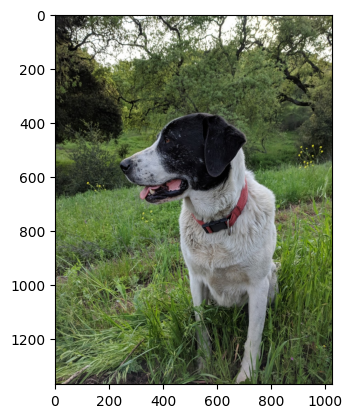

In [5]:
full = cv2.imread('DATA/sammy.jpg')
full = cv2.cvtColor(full, cv2.COLOR_BGR2RGB)
plt.imshow(full)

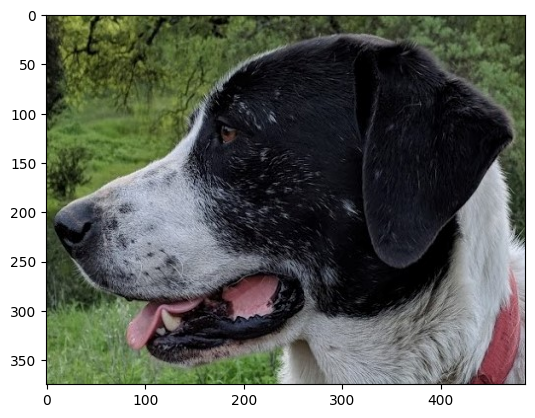

In [6]:
face = cv2.imread("DATA/sammy_face.jpg")
face = cv2.cvtColor(face,cv2.COLOR_BGR2RGB)
plt.imshow(face)

In [7]:
# EVAL FUNCTION
mystring = 'sum'
eval(mystring)

<function sum(iterable, /, start=0)>

In [8]:
myfunc = eval(mystring)

In [9]:
myfunc([1,2,3])

6

In [10]:
# All the 6 methods for comparison in a list
# Note how we are using strings, later on we'll use the eval() function to convert to function
methods = ['cv2.TM_CCOEFF', 'cv2.TM_CCOEFF_NORMED', 'cv2.TM_CCORR','cv2.TM_CCORR_NORMED', 'cv2.TM_SQDIFF', 'cv2.TM_SQDIFF_NORMED']

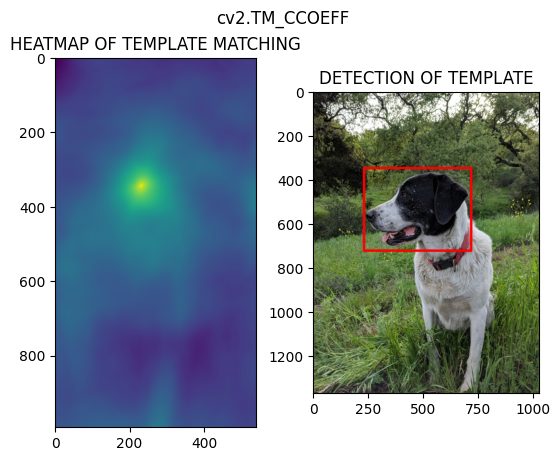

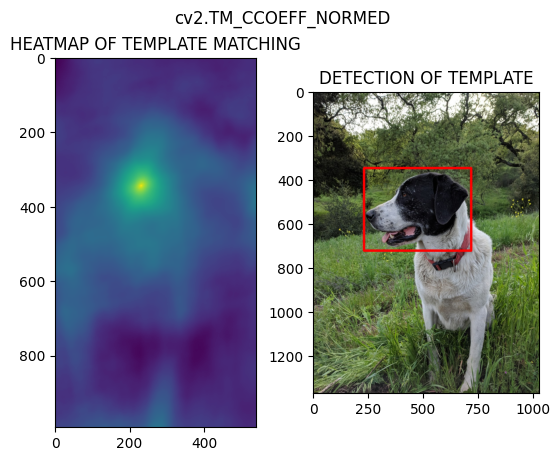

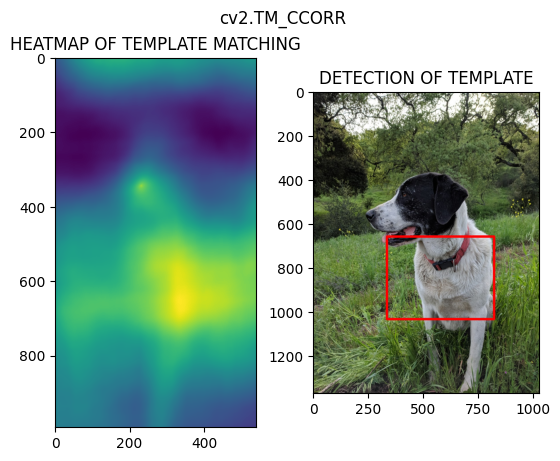

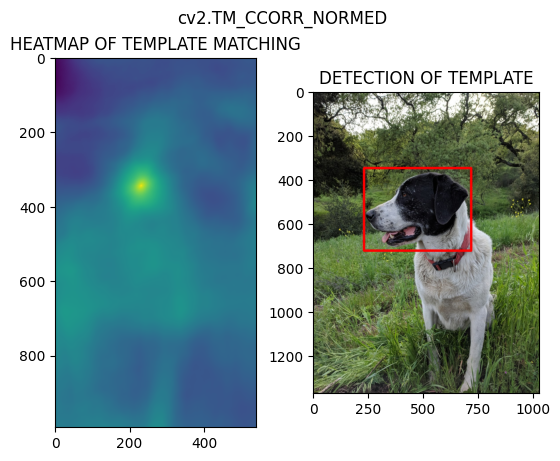

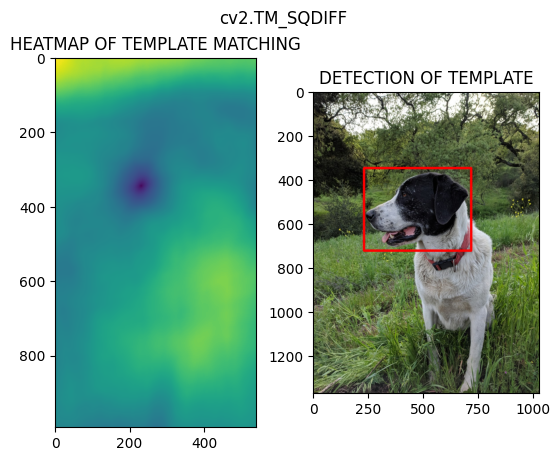

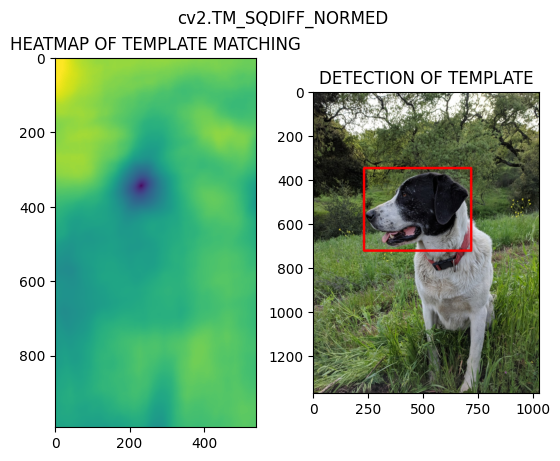

In [11]:
for m in methods:
  # Create a copy
  full_copy = full.copy()
  
  method = eval(m)
  
  # TEMPLATE MATCHING
  res = cv2.matchTemplate(full_copy,face,method)
  
  [min_val, max_val, min_loc, max_loc] = cv2.minMaxLoc(res)
  
  if method in [cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]:
    top_left = min_loc # (x, y)
  else:
    top_left = max_loc
    
  height, width, channels = face.shape
  
  bottom_right = (top_left[0]+width, top_left[1]+height)
  
  cv2.rectangle(full_copy, top_left, bottom_right, (255,0,0),10)
  
  # PLOT AND SHOW THE IMAGES
  plt.subplot(121)
  plt.imshow(res)
  plt.title('HEATMAP OF TEMPLATE MATCHING')
  
  plt.subplot(122)
  plt.imshow(full_copy)
  plt.title('DETECTION OF TEMPLATE')
  # TITLE WITH THE METHOD USED
  plt.suptitle(m)
  
  plt.show()
  
  print('\n\n')
  


In [12]:
my_method = eval('cv2.TM_CCOEFF')
res = cv2.matchTemplate(full,face,my_method)

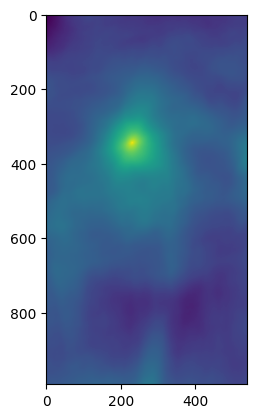

In [13]:
plt.imshow(res)

## CORNER DETECTION

http://www.ai.mit.edu/courses/6.891/handouts/shi94good.pdf

https://en.wikipedia.org/wiki/Harris_corner_detector

http://www.ai.mit.edu/courses/6.891/handouts/shi94good.pdf

### HARRIS ALGORITHM

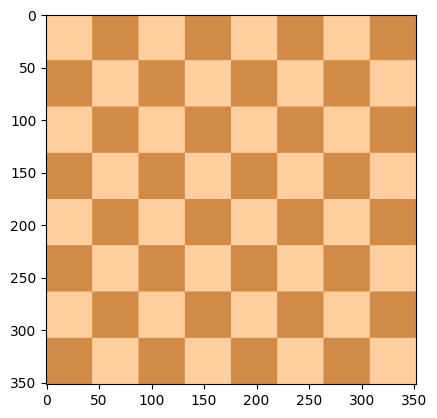

In [14]:
flat_chess = cv2.imread('DATA/flat_chessboard.png')
flat_chess = cv2.cvtColor(flat_chess, cv2.COLOR_BGR2RGB)

plt.imshow(flat_chess)

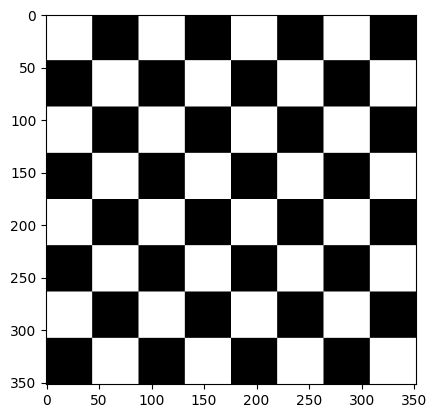

In [15]:
gray_flat_chess = cv2.cvtColor(flat_chess,cv2.COLOR_BGR2GRAY)
plt.imshow(gray_flat_chess,cmap='gray')

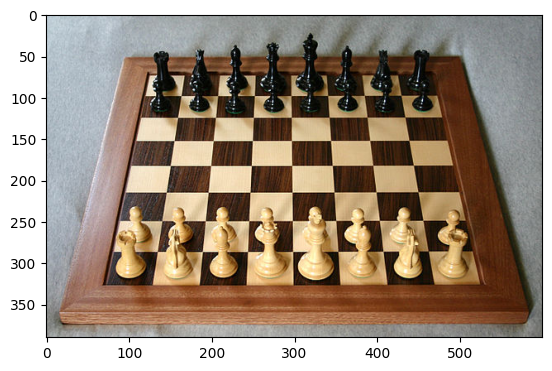

In [16]:
real_chess = cv2.imread('DATA/real_chessboard.jpg')
real_chess = cv2.cvtColor(real_chess, cv2.COLOR_BGR2RGB)
plt.imshow(real_chess)

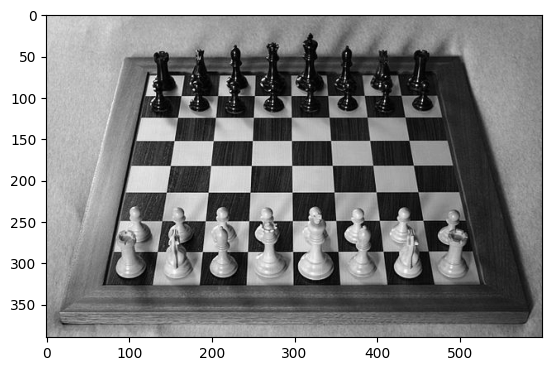

In [17]:
gray_real_chess = cv2.cvtColor(real_chess,cv2.COLOR_BGR2GRAY)
plt.imshow(gray_real_chess,cmap='gray')

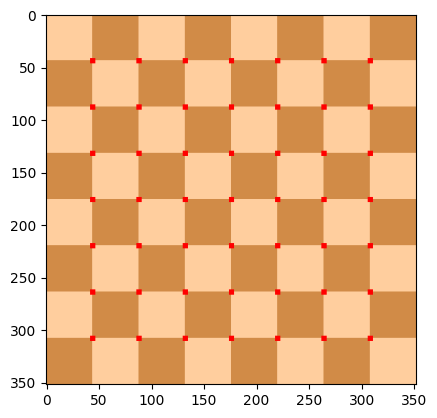

In [18]:
## EDGE DETECTION ALGORITHM

gray = np.float32(gray_flat_chess)
dst = cv2.cornerHarris(src=gray, blockSize=2, ksize=3, k=0.04)
dst = cv2.dilate(dst, None)
# plt.imshow(dst)

flat_chess[dst>0.01*dst.max()] = [255,0,0] # RGB

plt.imshow(flat_chess)

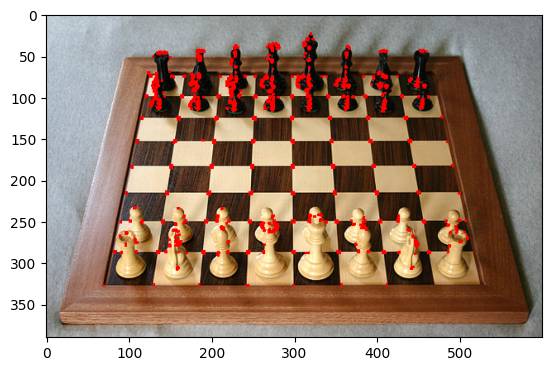

In [19]:
gray = np.float32(gray_real_chess)

# Corner Harris Detection
dst = cv2.cornerHarris(src=gray,blockSize=2,ksize=3,k=0.04)

# result is dilated for marking the corners, not important to actual corner detection
# this is just so we can plot out the points on the image shown
dst = cv2.dilate(dst,None)

# Threshold for an optimal value, it may vary depending on the image.
real_chess[dst>0.01*dst.max()]=[255,0,0]
plt.imshow(real_chess)



### SHI-TOMASI ALGORITHM

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_20204\107837280.py:5: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  corners = np.int0(corners)


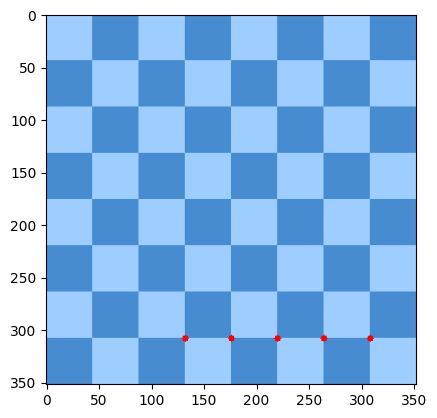

In [20]:
flat_chess = cv2.imread('DATA/flat_chessboard.png')
gray_flat_chess = cv2.cvtColor(flat_chess,cv2.COLOR_BGR2GRAY)

corners = cv2.goodFeaturesToTrack(gray_flat_chess, 5, 0.01, 10)
corners = np.int0(corners)

for i in corners:
  x,y = i.ravel()
  cv2.circle(flat_chess,(x,y),3,(255,0,0),-1)
  
plt.imshow(flat_chess)

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_20204\2644492532.py:5: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  corners = np.int0(corners)


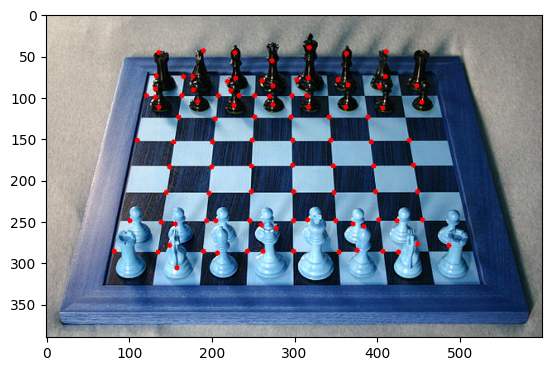

In [21]:
real_chess = cv2.imread('DATA/real_chessboard.jpg')
gray_real_chess = cv2.cvtColor(real_chess,cv2.COLOR_BGR2GRAY)

corners = cv2.goodFeaturesToTrack(gray_real_chess, 100, 0.01, 10)
corners = np.int0(corners)

for i in corners:
  x,y = i.ravel()
  cv2.circle(real_chess,(x,y),3,(255,0,0),-1)
  
plt.imshow(real_chess)

## EDGE DETECTION


https://en.wikipedia.org/wiki/Edge_detection

https://en.wikipedia.org/wiki/Canny_edge_detector

### JOHN CANNY ALGORITHM

In [22]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

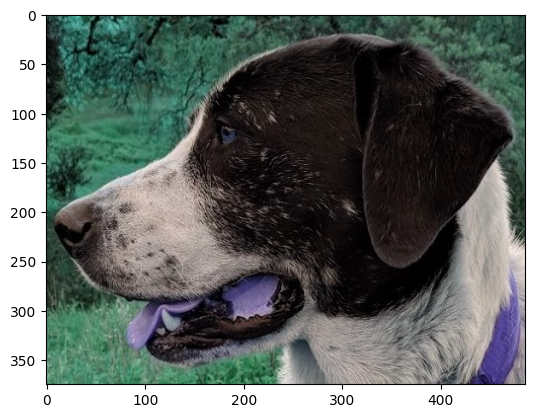

In [23]:
img = cv2.imread('DATA/sammy_face.jpg')
plt.imshow(img)

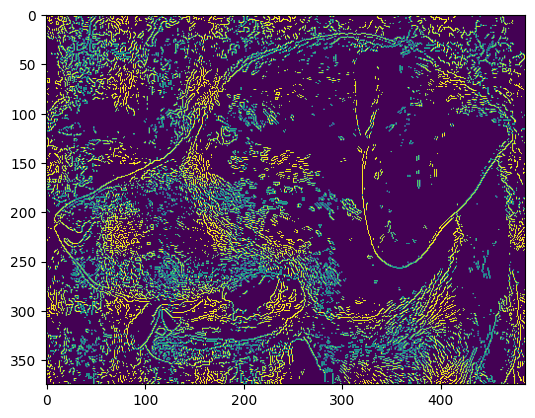

In [24]:
edges = cv2.Canny(image=img, threshold1=127, threshold2=127)
plt.imshow(edges)

In [25]:
med_val = np.median(img)
med_val

64.0

In [26]:
# LOWER THRESHOLD TO EITHER 0 OR 70% OF THE MEDIAN VALUE WHICHEVER IS GREATER
lower = int(max(0,0.7*med_val))
# UPPER THRESHOLD TO EITHER 130% OF THE MEDIAN VALUE OR 255, WHICHEVER IS GREATER
upper = int(max(255,1.3*med_val))

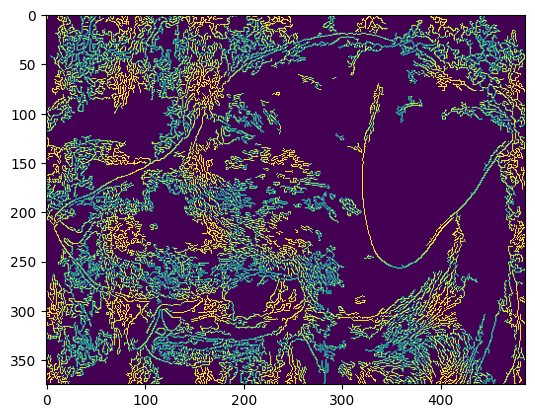

In [27]:
edges = cv2.Canny(image=img,threshold1=lower, threshold2=upper)
plt.imshow(edges)

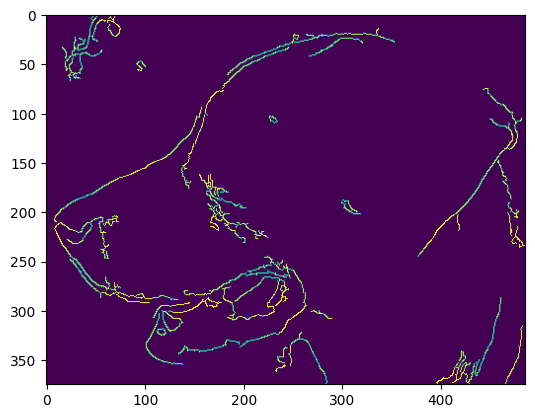

In [28]:
blurred_img = cv2.blur(img,ksize=(4,4))
edges = cv2.Canny(image=blurred_img, threshold1=lower,threshold2=upper)
plt.imshow(edges)

## GRID DETECTION

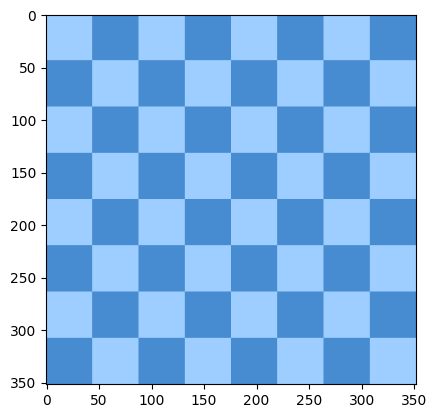

In [29]:
import cv2
import matplotlib.pyplot as plt
%matplotlib inline
flat_chess = cv2.imread('DATA/flat_chessboard.png')
plt.imshow(flat_chess,cmap='gray')

In [30]:
found, corners = cv2.findChessboardCorners(flat_chess,(7,7))
found

True

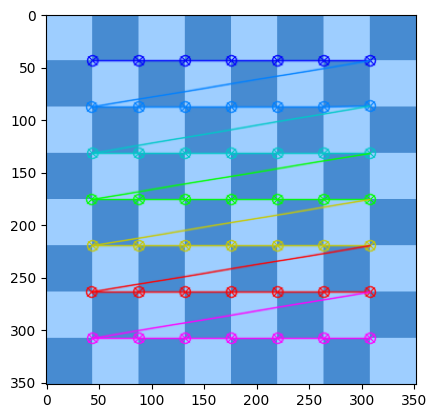

In [31]:
cv2.drawChessboardCorners(flat_chess, (7,7), corners, found)
plt.imshow(flat_chess)

In [32]:
dots = cv2.imread('DATA/dot_grid.png')

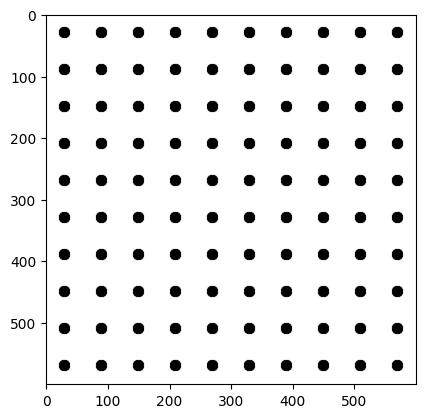

In [33]:
plt.imshow(dots)

In [34]:
found, corners = cv2.findCirclesGrid(dots, (10,10), cv2.CALIB_CB_SYMMETRIC_GRID)

In [35]:
found

True

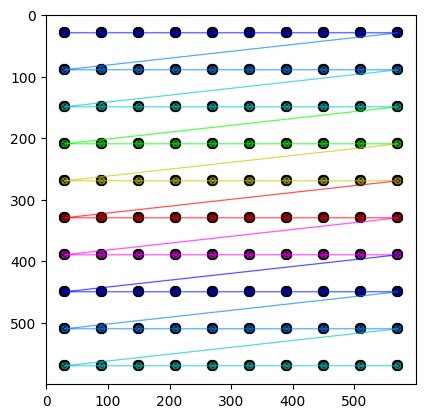

In [36]:
cv2.drawChessboardCorners(dots, (10,10),corners,found)
plt.imshow(dots)

## CONTOUR DETECTION

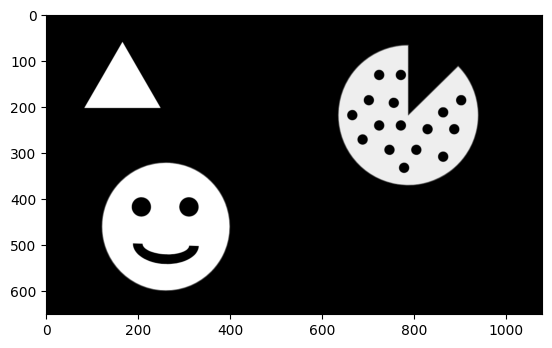

In [37]:
import cv2
import matplotlib.pyplot as plt
%matplotlib inline
img = cv2.imread('DATA/internal_external.png',0)
plt.imshow(img,cmap='gray')

In [38]:
contours, hierarchy = cv2.findContours(img, cv2.RETR_CCOMP,cv2.CHAIN_APPROX_SIMPLE)

In [39]:
type(hierarchy)

numpy.ndarray

In [40]:
hierarchy

array([[[ 4, -1,  1, -1],
        [ 2, -1, -1,  0],
        [ 3,  1, -1,  0],
        [-1,  2, -1,  0],
        [21,  0,  5, -1],
        [ 6, -1, -1,  4],
        [ 7,  5, -1,  4],
        [ 8,  6, -1,  4],
        [ 9,  7, -1,  4],
        [10,  8, -1,  4],
        [11,  9, -1,  4],
        [12, 10, -1,  4],
        [13, 11, -1,  4],
        [14, 12, -1,  4],
        [15, 13, -1,  4],
        [16, 14, -1,  4],
        [17, 15, -1,  4],
        [18, 16, -1,  4],
        [19, 17, -1,  4],
        [20, 18, -1,  4],
        [-1, 19, -1,  4],
        [-1,  4, -1, -1]]], dtype=int32)

In [41]:
external_contours = np.zeros(img.shape)

In [42]:
for i in range(len(contours)):
  # EXTERNAL CONOTOUR
  if hierarchy[0][i][3] == -1:
    
    cv2.drawContours(external_contours,contours,i,255,-1)

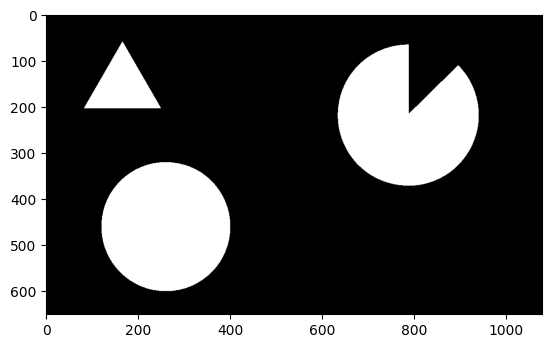

In [43]:
plt.imshow(external_contours,cmap='gray')

In [44]:
internal_contours = np.zeros(img.shape)
for i in range(len(contours)):
  
  # EXTERNAL CONOTOUR
  if hierarchy[0][i][3] == 0:
    
    cv2.drawContours(internal_contours,contours,i,255,-1)

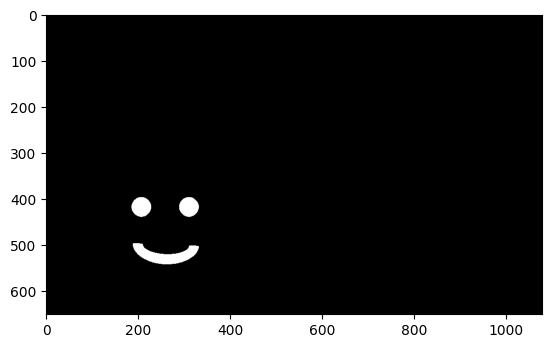

In [45]:
plt.imshow(internal_contours,cmap='gray')

## FEATURE MATCHING

In [46]:
import cv2
import matplotlib.pyplot as plt
%matplotlib inline
def display(img,cmap='gray'):
    fig = plt.figure(figsize=(12,10))
    ax = fig.add_subplot(111)
    ax.imshow(img,cmap='gray')


In [47]:
def display(img,cmap='gray'):
    fig = plt.figure(figsize=(12,10))
    ax = fig.add_subplot(111)
    ax.imshow(img,cmap='gray')
    

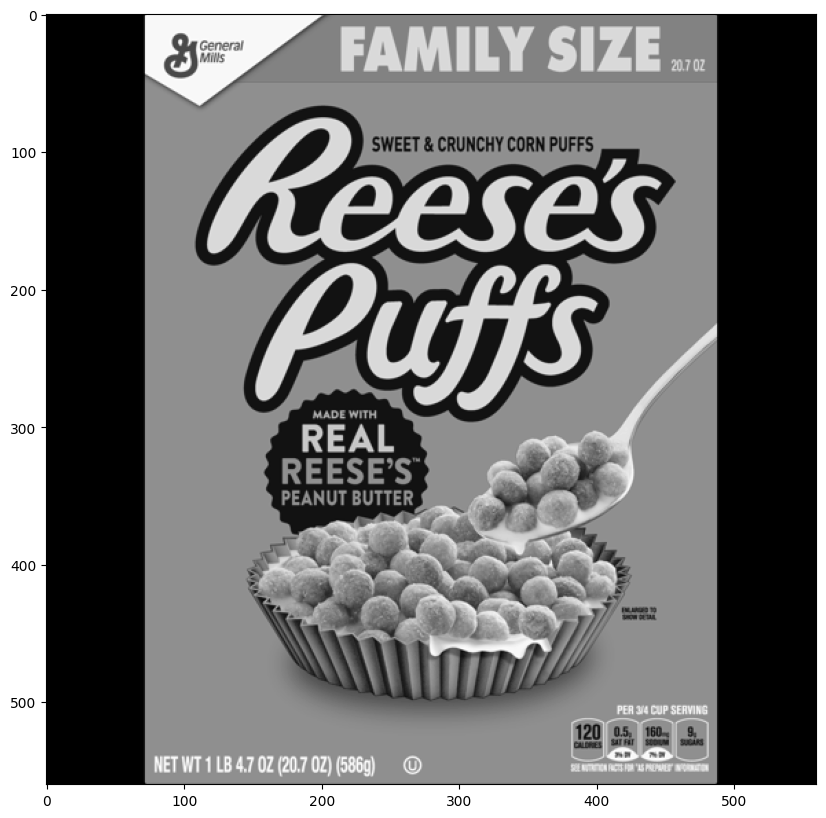

In [48]:
reeses = cv2.imread('DATA/reeses_puffs.png',0)
display(reeses)

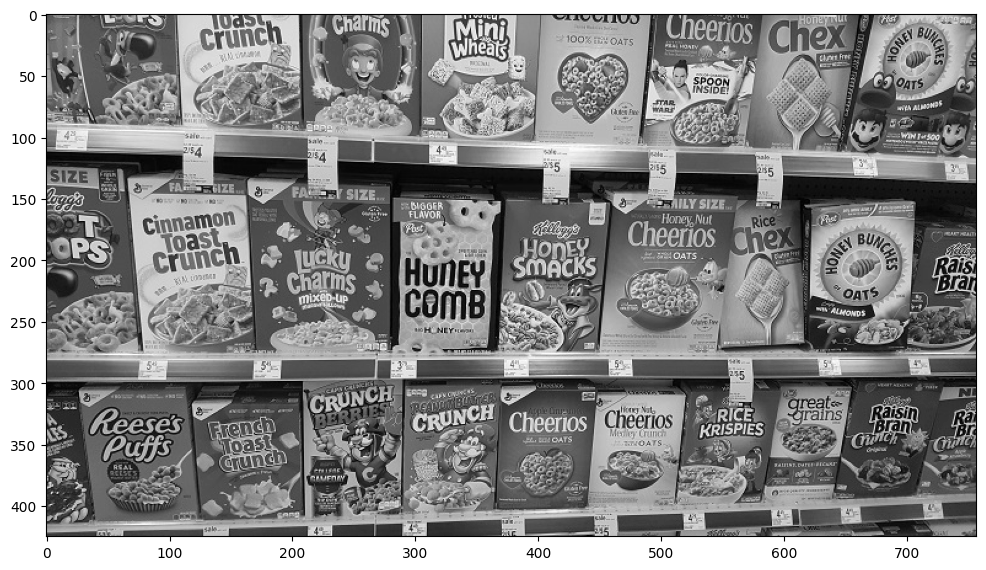

In [49]:
cereals = cv2.imread('Data/many_cereals.jpg',0)
display(cereals)

In [50]:
orb = cv2.ORB_create()
kp1,des1 = orb.detectAndCompute(reeses,None)
kp2,des2 = orb.detectAndCompute(cereals,None)

In [51]:
bf = cv2.BFMatcher(cv2.NORM_HAMMING,crossCheck=True)

In [52]:
matches = bf.match(des1,des2)

In [53]:
single_match = matches[0]
matches = sorted(matches, key= lambda x:x.distance)

In [54]:
reeses_matches = cv2.drawMatches(reeses,kp1,cereals,kp2,matches[:25],None,flags=2)

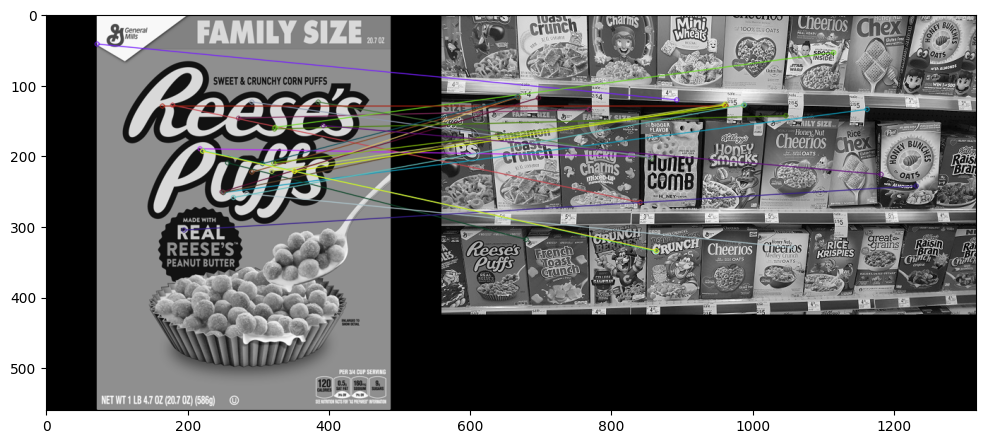

In [55]:
display(reeses_matches)
# not that good, to do that we need more sophisticated method

### Brute-Force Matching with SIFT Descriptors and Ratio Test 

In [56]:
sift = cv2.SIFT_create()

In [57]:
kp1, des1 = sift.detectAndCompute(reeses, None)
kp2, des2 = sift.detectAndCompute(cereals, None)

In [58]:
bf = cv2.BFMatcher()

In [59]:
matches = bf.knnMatch(des1,des2,k=2)

matches



((< cv2.DMatch 000001E85F51EF50>, < cv2.DMatch 000001E850C64510>),
 (< cv2.DMatch 000001E850C644F0>, < cv2.DMatch 000001E85B72D430>),
 (< cv2.DMatch 000001E85B72D4F0>, < cv2.DMatch 000001E85B72C750>),
 (< cv2.DMatch 000001E85B72D6F0>, < cv2.DMatch 000001E85B72C350>),
 (< cv2.DMatch 000001E85B72D5F0>, < cv2.DMatch 000001E85B72CE70>),
 (< cv2.DMatch 000001E85B72C630>, < cv2.DMatch 000001E85B72CE30>),
 (< cv2.DMatch 000001E85B72D650>, < cv2.DMatch 000001E85B72C590>),
 (< cv2.DMatch 000001E85B72C570>, < cv2.DMatch 000001E85B72D970>),
 (< cv2.DMatch 000001E85B72C650>, < cv2.DMatch 000001E85B72D630>),
 (< cv2.DMatch 000001E85B72CE50>, < cv2.DMatch 000001E85B72C910>),
 (< cv2.DMatch 000001E85B72D690>, < cv2.DMatch 000001E85B72CA10>),
 (< cv2.DMatch 000001E85B72D470>, < cv2.DMatch 000001E85B72D7D0>),
 (< cv2.DMatch 000001E85B72D990>, < cv2.DMatch 000001E85B72D930>),
 (< cv2.DMatch 000001E85B72C830>, < cv2.DMatch 000001E85B72D0D0>),
 (< cv2.DMatch 000001E85B72DAF0>, < cv2.DMatch 000001E85B72DA3

In [60]:
good = []

# LESS DISTANCE == BETTER MATCH
# RATIO TEST MATCH1 < 75% MATCH 2
for match1, match2 in matches:
  # IF MATCH 1 DISTANCE is LESS THAN 75% of MATCH 2 DISTANCE
  # THEN DESCRIPTOR WAS A GOOD MATCH, LETS KEEP IT!
  if match1.distance < 0.75*match2.distance:
    good.append([match1])

In [61]:
good

[[< cv2.DMatch 000001E85F51EF50>],
 [< cv2.DMatch 000001E85B72E390>],
 [< cv2.DMatch 000001E85B72E950>],
 [< cv2.DMatch 000001E85B72E990>],
 [< cv2.DMatch 000001E85B72EB90>],
 [< cv2.DMatch 000001E85B72F190>],
 [< cv2.DMatch 000001E85B72F490>],
 [< cv2.DMatch 000001E85B72F610>],
 [< cv2.DMatch 000001E85B72F990>],
 [< cv2.DMatch 000001E85B72FBD0>],
 [< cv2.DMatch 000001E85B72FF90>],
 [< cv2.DMatch 000001E85B7700D0>],
 [< cv2.DMatch 000001E85B771350>],
 [< cv2.DMatch 000001E85B771390>],
 [< cv2.DMatch 000001E85B771490>],
 [< cv2.DMatch 000001E85B772210>],
 [< cv2.DMatch 000001E85B772B90>],
 [< cv2.DMatch 000001E85B772C50>],
 [< cv2.DMatch 000001E85B772D10>],
 [< cv2.DMatch 000001E85B773590>],
 [< cv2.DMatch 000001E85B7736D0>],
 [< cv2.DMatch 000001E850C3C810>],
 [< cv2.DMatch 000001E850C3C950>],
 [< cv2.DMatch 000001E850C3C990>],
 [< cv2.DMatch 000001E850C3CB50>],
 [< cv2.DMatch 000001E850C3CB90>],
 [< cv2.DMatch 000001E850C3DD90>],
 [< cv2.DMatch 000001E850C3DF10>],
 [< cv2.DMatch 00000

In [62]:
sift_matches = cv2.drawMatchesKnn(reeses,kp1,cereals,kp2,good,None,flags=2)

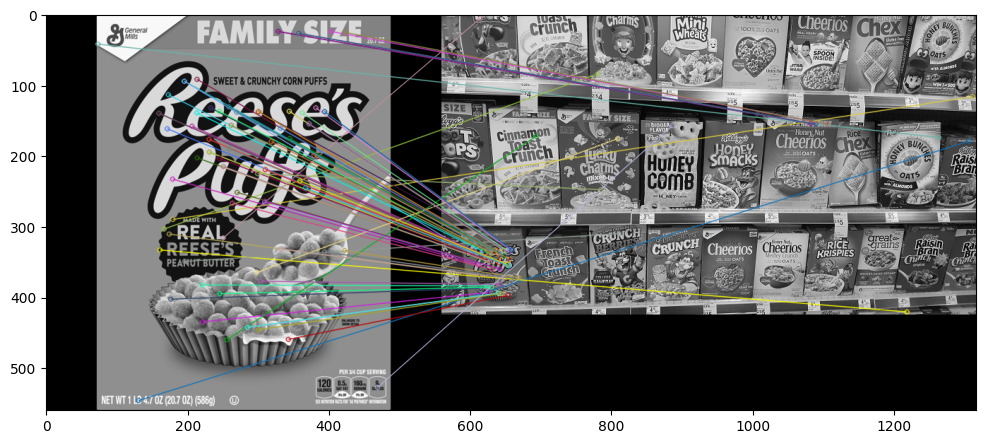

In [63]:
display(sift_matches)

In [64]:
import cv2
import matplotlib.pyplot as plt
%matplotlib inline

def display(img,cmap='gray'):
    fig = plt.figure(figsize=(12,10))
    ax = fig.add_subplot(111)
    ax.imshow(img,cmap='gray')


# Initiate SIFT detector
sift = cv2.SIFT_create()

# find the keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(reeses,None)
kp2, des2 = sift.detectAndCompute(cereals,None)

# FLANN parameters
FLANN_INDEX_KDTREE = 0
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict(checks=50)  

flann = cv2.FlannBasedMatcher(index_params,search_params)

matches = flann.knnMatch(des1,des2,k=2)

# Need to draw only good matches, so create a mask
matchesMask = [[0,0] for i in range(len(matches))]

# ratio test
for i,(match1,match2) in enumerate(matches):
    if match1.distance < 0.7*match2.distance:
        matchesMask[i]=[1,0]

draw_params = dict(matchColor = (0,255,0),
                   singlePointColor = (255,0,0),
                   matchesMask = matchesMask,
                   flags = 2)

flann_matches = cv2.drawMatchesKnn(reeses,kp1,cereals,kp2,matches,None,**draw_params)

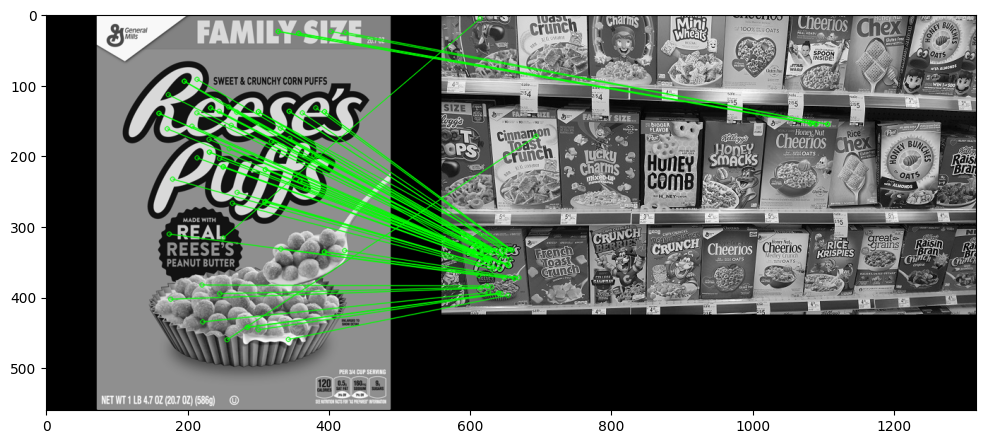

In [65]:
display(flann_matches)

## WATERSHED ALGORITHM

https://en.wikipedia.org/wiki/Watershed_(image_processing)

In [66]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
%matplotlib inline

def display(img,cmap='gray'):
    fig = plt.figure(figsize=(10,8))
    ax = fig.add_subplot(111)
    ax.imshow(img,cmap=cmap)

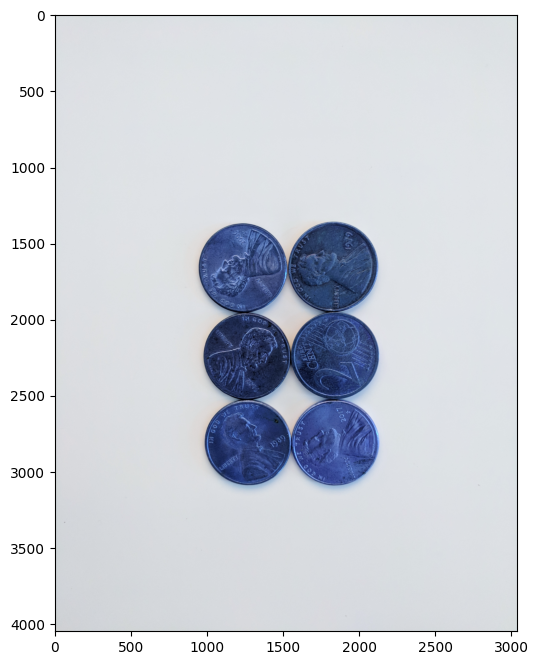

In [67]:
sep_coins = cv2.imread('DATA/pennies.jpg')
display(sep_coins)

In [68]:
# STEPS
# Median Blur
# Grayscale
# Binary Threshold
# Find Contours

sep_blur = cv2.medianBlur(sep_coins, 25)

In [69]:
display(sep_blur)

In [ ]:
gray_sep_coins = cv2.cvtColor(sep_blur,cv2.COLOR_BGR2GRAY)

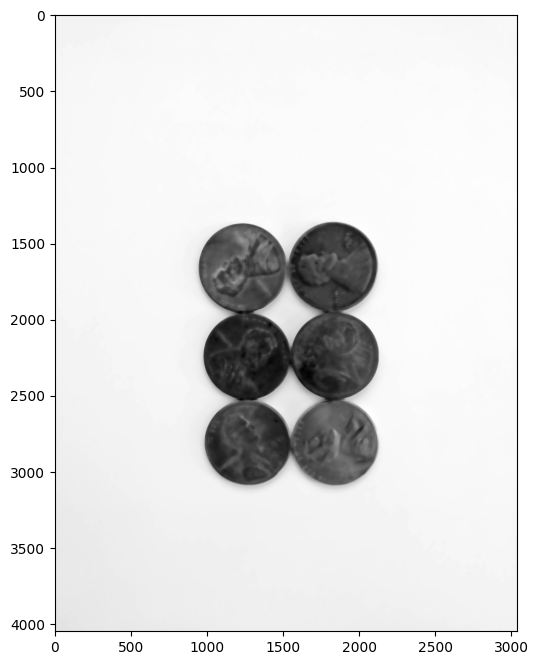

In [ ]:
display(gray_sep_coins, cmap='gray')

In [ ]:
ret, sep_tresh = cv2.threshold(gray_sep_coins,160,255,cv2.THRESH_BINARY_INV)

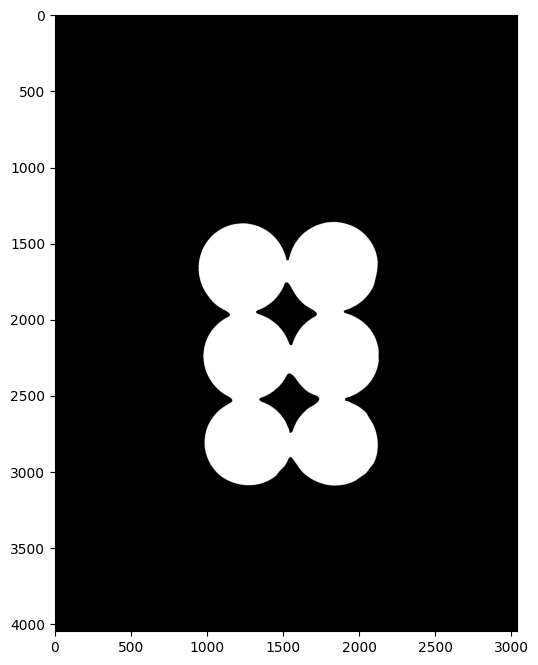

In [ ]:
display(sep_tresh,cmap='gray')

In [ ]:
sep_thresh_cpy = sep_tresh.copy()
contours, hierarchy = cv2.findContours(sep_thresh_cpy,cv2.RETR_CCOMP, cv2.CHAIN_APPROX_SIMPLE)
hierarchy

array([[[-1, -1,  1, -1],
        [ 2, -1, -1,  0],
        [-1,  1, -1,  0]]], dtype=int32)

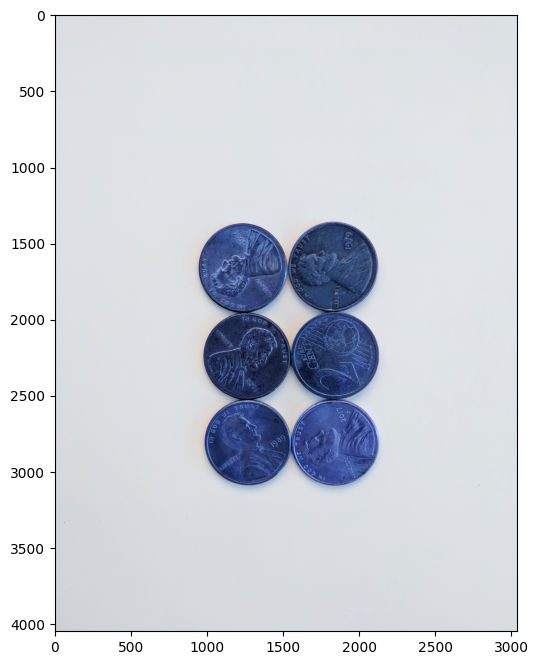

In [ ]:
for i in range(len(contours)):
  
  if hierarchy[0][i][3] == -1:
    cv2.drawContours(sep_coins,contours,i,(255,0,0))

display(sep_coins)

In [ ]:
# DIDNT WORK PROPERLY

## WATERSHED ALGORITHM

In [ ]:
img = cv2.imread('DATA/pennies.jpg')

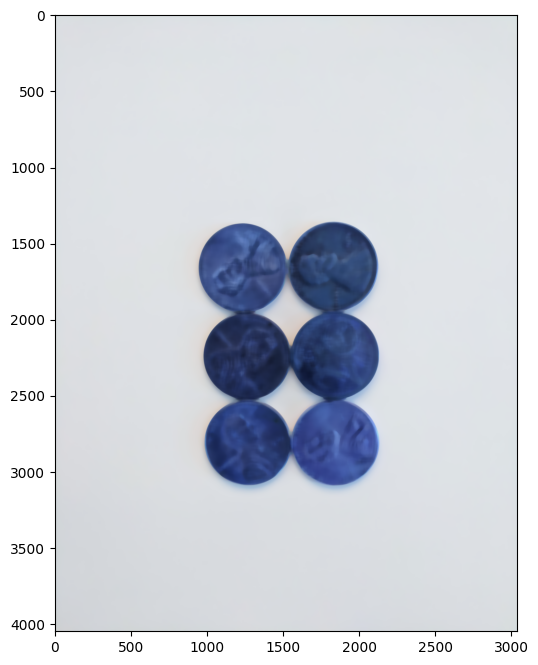

In [ ]:
img = cv2.medianBlur(img, 35)
display(img)

In [ ]:
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

In [ ]:
ret, thresh = cv2.threshold(gray, 0,255,cv2.THRESH_BINARY_INV+ cv2.THRESH_OTSU)

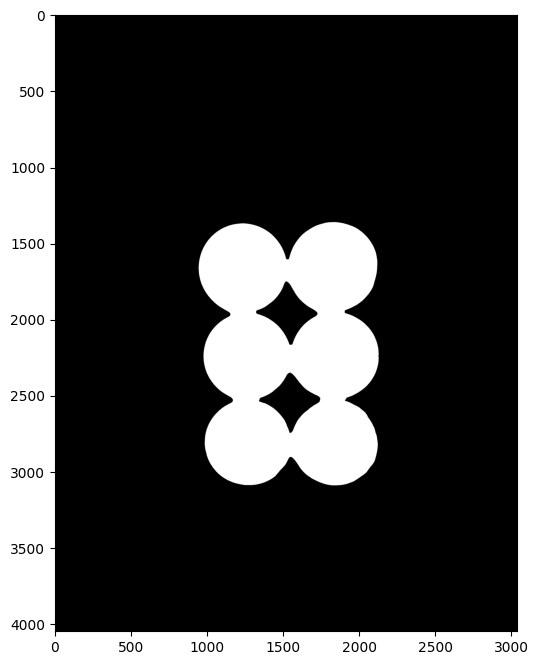

In [ ]:
display(thresh)

In [ ]:
# NOISE REMOVAL (OPTIONAL)

kernel = np.ones((3,3), np.uint8)

In [ ]:
opening = cv2.morphologyEx(thresh,cv2.MORPH_OPEN, kernel,iterations=2)
sure_bg = cv2.dilate(opening,kernel,iterations=3)

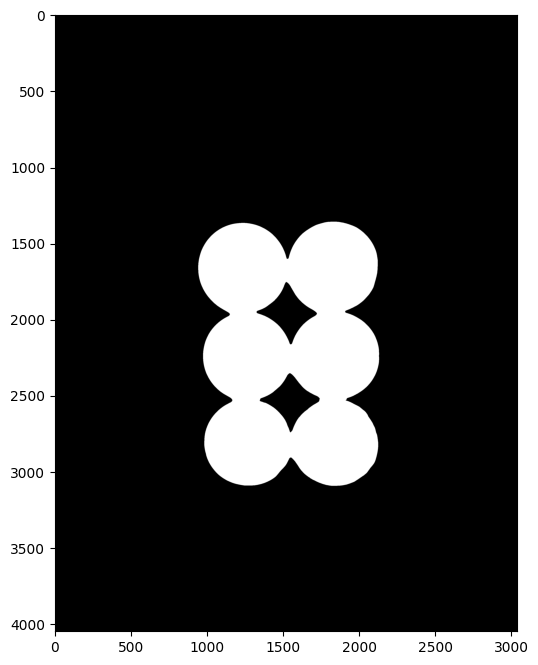

In [ ]:
display(sure_bg)

In [ ]:
# DISTANCE TRANSORMS ALGOTIRHM

dist_transform = cv2.distanceTransform(opening,cv2.DIST_L2,5)

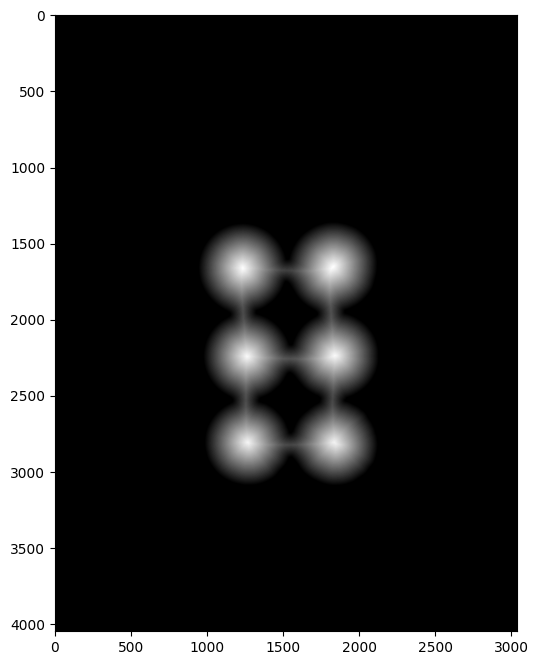

In [ ]:
display(dist_transform)

In [ ]:
# SECCOND THRESHOLD

ret, sure_fg = cv2.threshold(dist_transform,0.7*dist_transform.max(),255,0)


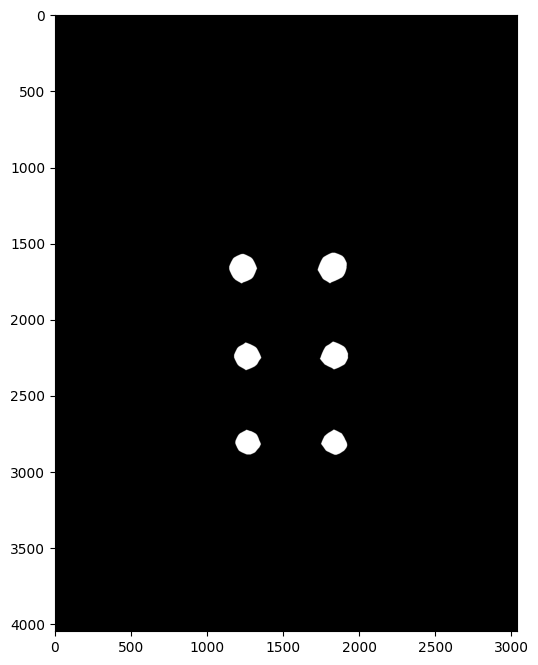

In [ ]:
display(sure_fg)

In [ ]:
sure_fg = np.uint8(sure_fg)

In [ ]:
unknown = cv2.subtract(sure_bg, sure_fg)
unknown

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

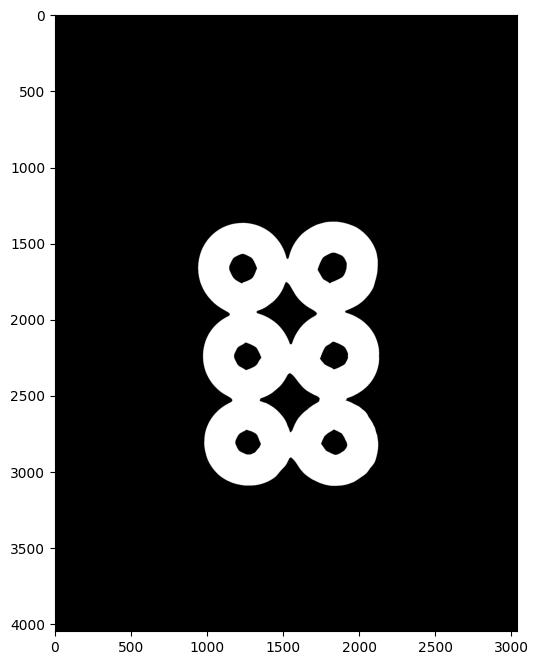

In [ ]:
display(unknown)

In [ ]:
# MARKERS
ret, markers = cv2.connectedComponents(sure_fg)

In [ ]:
markers = markers + 1

In [ ]:
markers[unknown == 255] = 0 # <-- zapis?

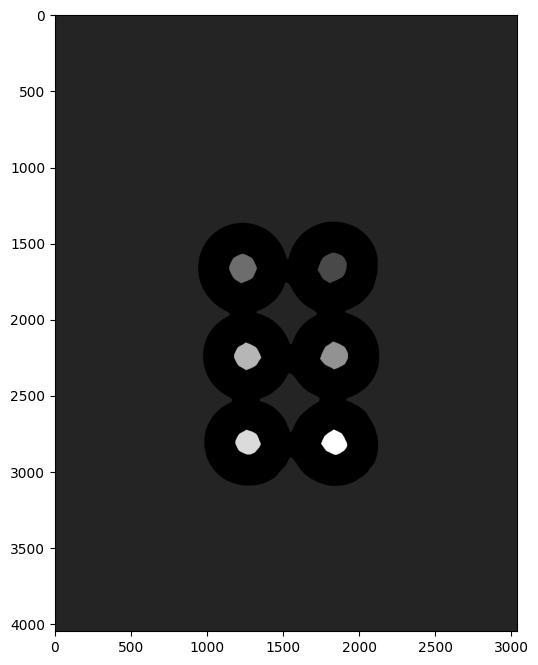

In [ ]:
display(markers)

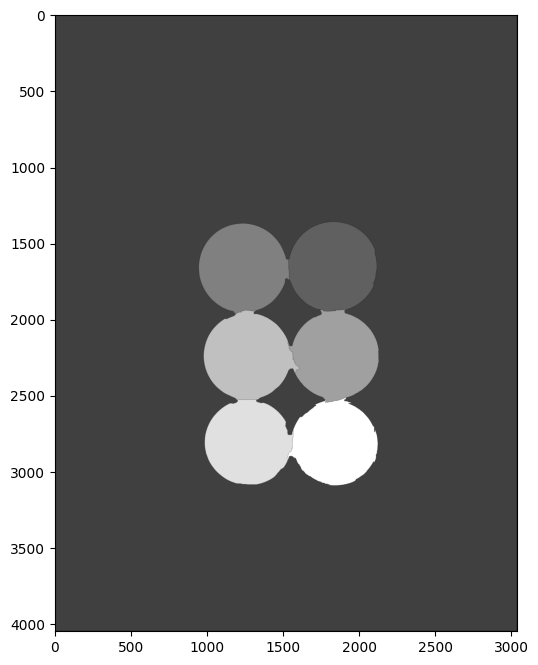

In [ ]:
markers = cv2.watershed(img, markers)
display(markers)

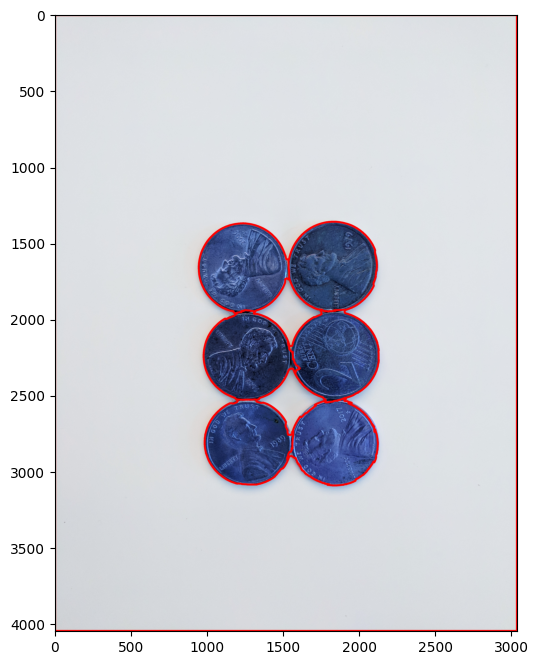

In [ ]:
contours, hierarchy = cv2.findContours(markers.copy(), cv2.RETR_CCOMP, cv2.CHAIN_APPROX_SIMPLE)

# For every entry in contours
for i in range(len(contours)):
    
    # last column in the array is -1 if an external contour (no contours inside of it)
    if hierarchy[0][i][3] == -1:
        
        # We can now draw the external contours from the list of contours
        cv2.drawContours(sep_coins, contours, i, (255, 0, 0), 10)
        
display(sep_coins)

## CUSTOM SEED WITH WATERSHED ALGORITHM

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

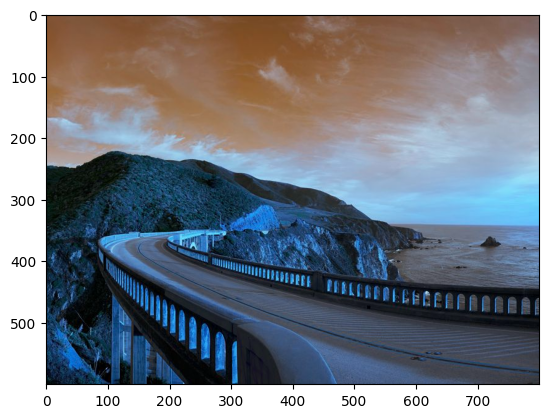

In [ ]:
road = cv2.imread('DATA/road_image.jpg')
road_cpy = np.copy(road)

plt.imshow(road)

In [ ]:
road.shape

(600, 800, 3)

In [ ]:
marker_image = np.zeros(road.shape[:2], dtype=np.int32)
segments = np.zeros(road.shape)
marker_image.shape


(600, 800)

In [ ]:
segments.shape

(600, 800, 3)

In [ ]:
# Qualitative colormapings
from matplotlib import cm

In [ ]:
cm.tab10(0)

(0.12156862745098039, 0.4666666666666667, 0.7058823529411765, 1.0)

In [ ]:
np.array(cm.tab10(0)[:3])

array([0.12156863, 0.46666667, 0.70588235])

In [ ]:
def create_rgb(i):  
  return tuple(np.array(cm.tab10(i)[:3])*255)

In [ ]:
colors = []
for i in range(10):
  colors.append(create_rgb(i))

In [ ]:
colors

[(31.0, 119.0, 180.0),
 (255.0, 127.0, 14.0),
 (44.0, 160.0, 44.0),
 (214.0, 39.0, 40.0),
 (148.0, 103.0, 189.0),
 (140.0, 86.0, 75.0),
 (227.0, 119.0, 194.0),
 (127.0, 127.0, 127.0),
 (188.0, 189.0, 34.0),
 (23.0, 190.0, 207.0)]

In [ ]:
### 
# GLOBAL VARIABLES
# COLOR CHOICE
current_marker = 1
n_markers = 10 #0-9
# MARKERS UPDATED BY WATERSHED
marks_updated = False


# CALLBACK FUNCTION
def mouse_callback(event,x,y,flags,param):
  global marks_updated
  
  if event == cv2.EVENT_LBUTTONDOWN:
    # MARKERS PASSED TO THE WATERSHED ALGO
    cv2.circle(marker_image,(x,y),10,(current_marker), -1)
    
    # USER SEES ON THE ROAD IMAGE
    cv2.circle(road_cpy, (x,y),10,colors[current_marker], -1)
    
    marks_updated = True


# WHILE TRUE
cv2.namedWindow('Road Image')
cv2.setMouseCallback('Road Image', mouse_callback)

while True:
  cv2.imshow('Watershed Segments', segments)
  cv2.imshow('Road Image', road_cpy)
  
  # CLOSE ALL WINDOWS
  k = cv2.waitKey(1)
  
  if k == 27:
    break
  
  # CLEARING ALL THE COLORS PRESS C KEY
  elif k == ord('c'):
    road_cpy = road.copy()
    marker_image = np.zeros(road.shape[:2], dtype=np.int32)
    segments = np.zeros(road.shape, dtype=np.uint8)
  
  # UPDATE COLOR CHOICE
  elif k > 0 and chr(k).isdigit():
    current_marker = int(chr(k))
  
  # UPDATE THE MARKINGS
  if marks_updated:
    
    marker_image_copy = marker_image.copy()
    cv2.watershed(road,marker_image_copy)
    
    segments = np.zeros(road.shape, dtype=np.uint8)
    
    for color_ind in range(n_markers):
      segments[marker_image_copy == (color_ind)] = colors[color_ind]
  

: 

## FACE DETECTION

### VIOLA-JONES DETECTION

In [1]:
import numpy as np
import cv2 
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
nadia = cv2.imread('DATA/Nadia_Murad.jpg',0)
denis = cv2.imread('DATA/Denis_Mukwege.jpg',0)
solvay = cv2.imread('DATA/solvay_conference.jpg',0)


In [8]:
face_cascade = cv2.CascadeClassifier('DATA/haarcascades/haarcascade_frontalface_default.xml')

In [7]:
def detect_face(img):
  face_img = img.copy()
  face_rects = face_cascade.detectMultiScale(face_img)
  print(face_rects)
  
  for (x,y,w,h) in face_rects:
    cv2.rectangle(face_img, (x,y), (x+w,y+h), (255,255,255),10)
  
  return face_img



In [6]:
result = detect_face(solvay)
plt.imshow(result)

NameError: name 'face_cascade' is not defined

In [5]:
def adjusted_detect_face(img):
  face_img = img.copy()
  face_rects = face_cascade.detectMultiScale(face_img,scaleFactor = 1.2, minNeighbors=5)
  print(face_rects)
  
  for (x,y,w,h) in face_rects:
    cv2.rectangle(face_img, (x,y), (x+w,y+h), (255,255,255),10)
  
  return face_img

[[ 301  120   52   52]
 [1302  304   59   59]
 [ 669  311   69   69]
 [ 913  246   54   54]
 [ 767  249   55   55]
 [ 499  308   60   60]
 [ 336  317   62   62]
 [1059  258   54   54]
 [ 587  256   62   62]
 [ 133  262   53   53]
 [ 422  260   58   58]
 [1217  260   64   64]
 [ 414  156   53   53]
 [1419  325   56   56]
 [1372  158   54   54]
 [ 498  195   52   52]
 [ 766  187   54   54]
 [1361  266   58   58]
 [ 897  160   46   46]
 [1232  161   48   48]
 [ 995  166   52   52]
 [ 631  169   53   53]
 [ 273  278   54   54]
 [1130  295   65   65]
 [1318  108   50   50]
 [ 862  300   62   62]
 [ 183  313   53   53]
 [1021  303   55   55]]


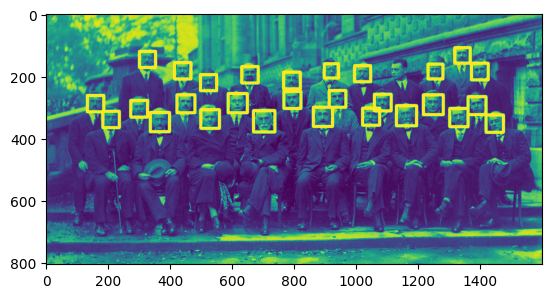

In [ ]:
result = adjusted_detect_face(solvay)
plt.imshow(result)

In [ ]:
eve_cascade = cv2.CascadeClassifier('DATA/haarcascades/haarcascade_eye.xml')

def detect_eye(img):
  face_img = img.copy()
  eyes_rects = eve_cascade.detectMultiScale(face_img)
  
  for (x,y,w,h) in eyes_rects:
    cv2.rectangle(face_img, (x,y), (x+w,y+h), (255,255,255),10)
  
  return face_img

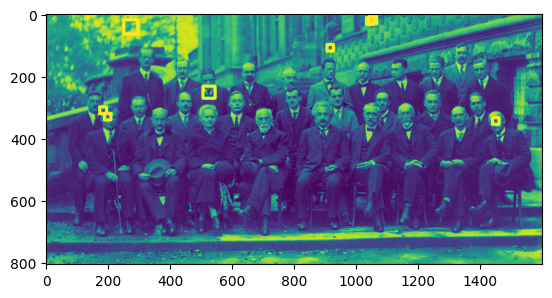

In [ ]:
result = detect_eye(solvay)
plt.imshow(result)

In [9]:
cap = cv2.VideoCapture(0)

width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

writer = cv2.VideoWriter('mytestVideo.mp4',cv2.VideoWriter_fourcc(*'DIVX'),24,(width,height))

while True:
  
  ret, frame = cap.read(0)
  frame = detect_face(frame)
  writer.write(frame)
  cv2.imshow('Video Face Detect', frame)
  
  k = cv2.waitKey(1)
  if k == 27:
    break
  
cap.release()
writer.release()
cv2.destroyAllWindows()

[[251 145 183 183]]
[[249 149 181 181]]
[[250 149 181 181]]
[[248 150 182 182]]
[[249 151 180 180]]
[[249 150 181 181]]
[[247 151 183 183]]
[[248 151 182 182]]
[[248 152 180 180]]
[[248 151 181 181]]
[[248 151 183 183]]
[[248 151 183 183]]
[[248 151 182 182]]
[[248 151 181 181]]
[[249 151 181 181]]
[[249 152 180 180]]
[[248 152 182 182]]
[[247 150 185 185]]
[[248 150 185 185]]
[[247 149 187 187]]
[[248 150 184 184]]
[[248 150 184 184]]
[[249 151 182 182]]
[[248 150 184 184]]
[[249 152 182 182]]
[[249 151 183 183]]
[[250 152 181 181]]
[[248 151 183 183]]
[[249 151 183 183]]
[[250 152 181 181]]
[[250 152 181 181]]
[[250 152 180 180]]
[[251 153 180 180]]
[[251 152 183 183]]
[[250 152 182 182]]
[[250 153 183 183]]
[[249 151 185 185]]
[[251 153 181 181]]
[[251 153 182 182]]
[[251 151 184 184]]
[[252 153 181 181]]
[[253 152 181 181]]
[[253 153 180 180]]
[[253 152 180 180]]
[[251 151 183 183]]
[[251 149 186 186]]
[[252 150 183 183]]
[[252 151 184 184]]
[[252 151 184 184]]
[[252 152 182 182]]
